In [1]:
import torch
torch.cuda.set_device(0)
import torch.nn as nn
from thop import profile
import os
from pathlib import Path
import pandas as pd
##---------- Basic Layers ----------
def conv3x3(in_chn, out_chn, bias=True):
    layer = nn.Conv2d(in_chn, out_chn, kernel_size=3, stride=1, padding=1, bias=bias)
    return layer


def conv(in_channels, out_channels, kernel_size, bias=False, stride=1):
    return nn.Conv2d(
        in_channels,
        out_channels,
        kernel_size,
        padding=(kernel_size // 2),
        bias=bias,
        stride=stride,
    )


def bili_resize(factor):
    return nn.Upsample(scale_factor=factor, mode="bilinear", align_corners=False)


##---------- Basic Blocks ----------
class UNetConvBlock(nn.Module):
    def __init__(self, in_size, out_size, downsample):
        super(UNetConvBlock, self).__init__()
        self.downsample = downsample
        self.block = SK_RDB(in_channels=in_size, growth_rate=out_size, num_layers=3)
        if downsample:
            self.downsample = PS_down(out_size, out_size, downscale=2)

    def forward(self, x):
        out = self.block(x)
        if self.downsample:
            out_down = self.downsample(out)
            return out_down, out
        else:
            return out


class UNetUpBlock(nn.Module):
    def __init__(self, in_size, out_size):
        super(UNetUpBlock, self).__init__()
        # self.up = nn.ConvTranspose2d(in_size, out_size, kernel_size=2, stride=2, bias=True)
        self.up = PS_up(in_size, out_size, upscale=2)
        self.conv_block = UNetConvBlock(in_size, out_size, False)

    def forward(self, x, bridge):
        up = self.up(x)
        out = torch.cat([up, bridge], dim=1)
        out = self.conv_block(out)
        return out


##---------- Resizing Modules (Pixel(Un)Shuffle) ----------
class PS_down(nn.Module):
    def __init__(self, in_size, out_size, downscale):
        super(PS_down, self).__init__()
        self.UnPS = nn.PixelUnshuffle(downscale)
        self.conv1 = nn.Conv2d((downscale**2) * in_size, out_size, 1, 1, 0)

    def forward(self, x):
        x = self.UnPS(x)  # h/2, w/2, 4*c
        x = self.conv1(x)
        return x


class PS_up(nn.Module):
    def __init__(self, in_size, out_size, upscale):
        super(PS_up, self).__init__()

        self.PS = nn.PixelShuffle(upscale)
        self.conv1 = nn.Conv2d(in_size // (upscale**2), out_size, 1, 1, 0)

    def forward(self, x):
        x = self.PS(x)  # h/2, w/2, 4*c
        x = self.conv1(x)
        return x


##---------- Selective Kernel Feature Fusion (SKFF) ----------
class SKFF(nn.Module):
    def __init__(self, in_channels, height=3, reduction=8, bias=False):
        super(SKFF, self).__init__()

        self.height = height
        d = max(int(in_channels / reduction), 4)

        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.conv_du = nn.Sequential(
            nn.Conv2d(in_channels, d, 1, padding=0, bias=bias), nn.PReLU()
        )

        self.fcs = nn.ModuleList([])
        for i in range(self.height):
            self.fcs.append(
                nn.Conv2d(d, in_channels, kernel_size=1, stride=1, bias=bias)
            )

        self.softmax = nn.Softmax(dim=1)

    def forward(self, inp_feats):
        batch_size, n_feats, H, W = inp_feats[1].shape

        inp_feats = torch.cat(inp_feats, dim=1)
        inp_feats = inp_feats.view(
            batch_size, self.height, n_feats, inp_feats.shape[2], inp_feats.shape[3]
        )

        feats_U = torch.sum(inp_feats, dim=1)
        feats_S = self.avg_pool(feats_U)
        feats_Z = self.conv_du(feats_S)

        attention_vectors = [fc(feats_Z) for fc in self.fcs]
        attention_vectors = torch.cat(attention_vectors, dim=1)
        attention_vectors = attention_vectors.view(
            batch_size, self.height, n_feats, 1, 1
        )

        attention_vectors = self.softmax(attention_vectors)
        feats_V = torch.sum(inp_feats * attention_vectors, dim=1)

        return feats_V


##---------- Dense Block ----------
class DenseLayer(nn.Module):
    def __init__(self, in_channels, out_channels, I):
        super(DenseLayer, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=3 // 2)
        self.relu = nn.ReLU(inplace=True)
        self.sk = SKFF(out_channels, height=2, reduction=8, bias=False)

    def forward(self, x):
        x1 = self.relu(self.conv(x))
        # output = torch.cat([x, x1], 1) # -> RDB
        output = self.sk((x, x1))
        return output


##---------- Selective Kernel Residual Dense Block (SK-RDB) ----------
class SK_RDB(nn.Module):
    def __init__(self, in_channels, growth_rate, num_layers):
        super(SK_RDB, self).__init__()
        self.identity = nn.Conv2d(in_channels, growth_rate, 1, 1, 0)
        self.layers = nn.Sequential(
            *[DenseLayer(in_channels, in_channels, I=i) for i in range(num_layers)]
        )
        self.lff = nn.Conv2d(in_channels, growth_rate, kernel_size=1)

    def forward(self, x):
        res = self.identity(x)
        x = self.layers(x)
        x = self.lff(x)
        return res + x


##---------- testNet ----------
class SRMNet(nn.Module):
    def __init__(self, in_chn=3, wf=96, depth=4):
        super(SRMNet, self).__init__()
        self.depth = depth
        self.down_path = nn.ModuleList()
        self.bili_down = bili_resize(0.5)
        self.conv_01 = nn.Conv2d(in_chn, wf, 3, 1, 1)

        # encoder of UNet
        prev_channels = 0
        for i in range(depth):  # 0,1,2,3
            downsample = True if (i + 1) < depth else False
            self.down_path.append(
                UNetConvBlock(prev_channels + wf, (2**i) * wf, downsample)
            )
            prev_channels = (2**i) * wf

        # decoder of UNet
        self.up_path = nn.ModuleList()
        self.skip_conv = nn.ModuleList()
        self.conv_up = nn.ModuleList()
        self.bottom_conv = nn.Conv2d(prev_channels, wf, 3, 1, 1)
        self.bottom_up = bili_resize(2 ** (depth - 1))

        for i in reversed(range(depth - 1)):
            self.up_path.append(UNetUpBlock(prev_channels, (2**i) * wf))
            self.skip_conv.append(nn.Conv2d((2**i) * wf, (2**i) * wf, 3, 1, 1))
            self.conv_up.append(
                nn.Sequential(
                    *[nn.Conv2d((2**i) * wf, wf, 3, 1, 1), bili_resize(2**i)]
                )
            )
            prev_channels = (2**i) * wf

        self.final_ff = SKFF(in_channels=wf, height=depth)
        self.last = conv3x3(prev_channels, in_chn, bias=True)

    def forward(self, x):
        img = x
        scale_img = img

        ##### shallow conv #####
        x1 = self.conv_01(img)
        encs = []
        ######## UNet ########
        # Down-path (Encoder)
        for i, down in enumerate(self.down_path):
            if i == 0:
                x1, x1_up = down(x1)
                encs.append(x1_up)
            elif (i + 1) < self.depth:
                scale_img = self.bili_down(scale_img)
                left_bar = self.conv_01(scale_img)
                x1 = torch.cat([x1, left_bar], dim=1)
                x1, x1_up = down(x1)
                encs.append(x1_up)
            else:
                scale_img = self.bili_down(scale_img)
                left_bar = self.conv_01(scale_img)
                x1 = torch.cat([x1, left_bar], dim=1)
                x1 = down(x1)

        # Up-path (Decoder)
        ms_result = [self.bottom_up(self.bottom_conv(x1))]
        for i, up in enumerate(self.up_path):
            x1 = up(x1, self.skip_conv[i](encs[-i - 1]))
            ms_result.append(self.conv_up[i](x1))
        # Multi-scale selective feature fusion
        msff_result = self.final_ff(ms_result)

        ##### Reconstruct #####
        out_1 = self.last(msff_result) + img

        return out_1

In [2]:
import torch
import torch.nn as nn
from torch.nn import init
from torch.optim import lr_scheduler

# U-Net: Convolutional Networks for Biomedical Image Segmentation
# https://arxiv.org/abs/1505.04597
class UNet(nn.Module):
    def __init__(self, nch_in, nch_out, nch_ker=64, norm="bnorm"):
        super(UNet, self).__init__()

        self.nch_in = nch_in
        self.nch_out = nch_out
        self.nch_ker = nch_ker
        self.norm = norm

        if norm == "bnorm":
            self.bias = False
        else:
            self.bias = True

        """
        Encoder part
        """

        self.enc1_1 = CNR2d(
            1 * self.nch_in,
            1 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )
        self.enc1_2 = CNR2d(
            1 * self.nch_ker,
            1 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )

        self.pool1 = Pooling2d(pool=2, type="avg")

        self.enc2_1 = CNR2d(
            1 * self.nch_ker,
            2 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )
        self.enc2_2 = CNR2d(
            2 * self.nch_ker,
            2 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )

        self.pool2 = Pooling2d(pool=2, type="avg")

        self.enc3_1 = CNR2d(
            2 * self.nch_ker,
            4 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )
        self.enc3_2 = CNR2d(
            4 * self.nch_ker,
            4 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )

        self.pool3 = Pooling2d(pool=2, type="avg")

        self.enc4_1 = CNR2d(
            4 * self.nch_ker,
            8 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )
        self.enc4_2 = CNR2d(
            8 * self.nch_ker,
            8 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )

        self.pool4 = Pooling2d(pool=2, type="avg")

        self.enc5_1 = CNR2d(
            8 * self.nch_ker,
            2 * 8 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )

        """
        Decoder part
        """

        self.dec5_1 = DECNR2d(
            2 * 8 * self.nch_ker,
            8 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )

        self.unpool4 = UnPooling2d(pool=2, type="nearest")

        self.dec4_2 = DECNR2d(
            2 * 8 * self.nch_ker,
            8 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )
        self.dec4_1 = DECNR2d(
            8 * self.nch_ker,
            4 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )

        self.unpool3 = UnPooling2d(pool=2, type="nearest")

        self.dec3_2 = DECNR2d(
            2 * 4 * self.nch_ker,
            4 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )
        self.dec3_1 = DECNR2d(
            4 * self.nch_ker,
            2 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )

        self.unpool2 = UnPooling2d(pool=2, type="nearest")

        self.dec2_2 = DECNR2d(
            2 * 2 * self.nch_ker,
            2 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )
        self.dec2_1 = DECNR2d(
            2 * self.nch_ker,
            1 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )

        self.unpool1 = UnPooling2d(pool=2, type="nearest")

        self.dec1_2 = DECNR2d(
            2 * 1 * self.nch_ker,
            1 * self.nch_ker,
            kernel_size=3,
            stride=1,
            norm=self.norm,
            relu=0.0,
            drop=[],
        )
        self.dec1_1 = DECNR2d(
            1 * self.nch_ker,
            1 * self.nch_out,
            kernel_size=3,
            stride=1,
            norm=[],
            relu=[],
            drop=[],
            bias=False,
        )

    def forward(self, x):

        """
        Encoder part
        """

        enc1 = self.enc1_2(self.enc1_1(x))
        pool1 = self.pool1(enc1)

        enc2 = self.enc2_2(self.enc2_1(pool1))
        pool2 = self.pool2(enc2)

        enc3 = self.enc3_2(self.enc3_1(pool2))
        pool3 = self.pool3(enc3)

        enc4 = self.enc4_2(self.enc4_1(pool3))
        pool4 = self.pool4(enc4)

        enc5 = self.enc5_1(pool4)

        """
        Encoder part
        """
        dec5 = self.dec5_1(enc5)

        unpool4 = self.unpool4(dec5)
        cat4 = torch.cat([enc4, unpool4], dim=1)
        dec4 = self.dec4_1(self.dec4_2(cat4))

        unpool3 = self.unpool3(dec4)
        cat3 = torch.cat([enc3, unpool3], dim=1)
        dec3 = self.dec3_1(self.dec3_2(cat3))

        unpool2 = self.unpool2(dec3)
        cat2 = torch.cat([enc2, unpool2], dim=1)
        dec2 = self.dec2_1(self.dec2_2(cat2))

        unpool1 = self.unpool1(dec2)
        cat1 = torch.cat([enc1, unpool1], dim=1)
        dec1 = self.dec1_1(self.dec1_2(cat1))

        x = dec1

        return x


class CNR2d(nn.Module):
    def __init__(
        self,
        nch_in,
        nch_out,
        kernel_size=4,
        stride=1,
        padding=1,
        norm="bnorm",
        relu=0.0,
        drop=[],
        bias=[],
    ):
        super().__init__()

        if bias == []:
            if norm == "bnorm":
                bias = False
            else:
                bias = True

        layers = []
        layers += [
            Conv2d(
                nch_in,
                nch_out,
                kernel_size=kernel_size,
                stride=stride,
                padding=padding,
                bias=bias,
            )
        ]

        if norm != []:
            layers += [Norm2d(nch_out, norm)]

        if relu != []:
            layers += [ReLU(relu)]

        if drop != []:
            layers += [nn.Dropout2d(drop)]

        self.cbr = nn.Sequential(*layers)

    def forward(self, x):
        return self.cbr(x)


class DECNR2d(nn.Module):
    def __init__(
        self,
        nch_in,
        nch_out,
        kernel_size=4,
        stride=1,
        padding=1,
        output_padding=0,
        norm="bnorm",
        relu=0.0,
        drop=[],
        bias=[],
    ):
        super().__init__()

        if bias == []:
            if norm == "bnorm":
                bias = False
            else:
                bias = True

        layers = []
        layers += [
            Deconv2d(
                nch_in,
                nch_out,
                kernel_size=kernel_size,
                stride=stride,
                padding=padding,
                output_padding=output_padding,
                bias=bias,
            )
        ]

        if norm != []:
            layers += [Norm2d(nch_out, norm)]

        if relu != []:
            layers += [ReLU(relu)]

        if drop != []:
            layers += [nn.Dropout2d(drop)]

        self.decbr = nn.Sequential(*layers)

    def forward(self, x):
        return self.decbr(x)


class ResBlock(nn.Module):
    def __init__(
        self,
        nch_in,
        nch_out,
        kernel_size=3,
        stride=1,
        padding=1,
        padding_mode="reflection",
        norm="bnorm",
        relu=0.0,
        drop=[],
        bias=[],
    ):
        super().__init__()

        if bias == []:
            if norm == "bnorm":
                bias = False
            else:
                bias = True

        layers = []

        # 1st conv
        layers += [Padding(padding, padding_mode=padding_mode)]
        layers += [
            CNR2d(
                nch_in,
                nch_out,
                kernel_size=kernel_size,
                stride=stride,
                padding=0,
                norm=norm,
                relu=relu,
            )
        ]

        if drop != []:
            layers += [nn.Dropout2d(drop)]

        # 2nd conv
        layers += [Padding(padding, padding_mode=padding_mode)]
        layers += [
            CNR2d(
                nch_in,
                nch_out,
                kernel_size=kernel_size,
                stride=stride,
                padding=0,
                norm=norm,
                relu=[],
            )
        ]

        self.resblk = nn.Sequential(*layers)

    def forward(self, x):
        return x + self.resblk(x)


class CNR1d(nn.Module):
    def __init__(self, nch_in, nch_out, norm="bnorm", relu=0.0, drop=[]):
        super().__init__()

        if norm == "bnorm":
            bias = False
        else:
            bias = True

        layers = []
        layers += [nn.Linear(nch_in, nch_out, bias=bias)]

        if norm != []:
            layers += [Norm2d(nch_out, norm)]

        if relu != []:
            layers += [ReLU(relu)]

        if drop != []:
            layers += [nn.Dropout2d(drop)]

        self.cbr = nn.Sequential(*layers)

    def forward(self, x):
        return self.cbr(x)


class Conv2d(nn.Module):
    def __init__(self, nch_in, nch_out, kernel_size=4, stride=1, padding=1, bias=True):
        super(Conv2d, self).__init__()
        self.conv = nn.Conv2d(
            nch_in,
            nch_out,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
            bias=bias,
        )

    def forward(self, x):
        return self.conv(x)


class Deconv2d(nn.Module):
    def __init__(
        self,
        nch_in,
        nch_out,
        kernel_size=4,
        stride=1,
        padding=1,
        output_padding=0,
        bias=True,
    ):
        super(Deconv2d, self).__init__()
        self.deconv = nn.ConvTranspose2d(
            nch_in,
            nch_out,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
            output_padding=output_padding,
            bias=bias,
        )

        # layers = [nn.Upsample(scale_factor=2, mode='bilinear'),
        #           nn.ReflectionPad2d(1),
        #           nn.Conv2d(nch_in , nch_out, kernel_size=3, stride=1, padding=0)]
        #
        # self.deconv = nn.Sequential(*layers)

    def forward(self, x):
        return self.deconv(x)


class Linear(nn.Module):
    def __init__(self, nch_in, nch_out):
        super(Linear, self).__init__()
        self.linear = nn.Linear(nch_in, nch_out)

    def forward(self, x):
        return self.linear(x)


class Norm2d(nn.Module):
    def __init__(self, nch, norm_mode):
        super(Norm2d, self).__init__()
        if norm_mode == "bnorm":
            self.norm = nn.BatchNorm2d(nch)
        elif norm_mode == "inorm":
            self.norm = nn.InstanceNorm2d(nch)

    def forward(self, x):
        return self.norm(x)


class ReLU(nn.Module):
    def __init__(self, relu):
        super(ReLU, self).__init__()
        if relu > 0:
            self.relu = nn.LeakyReLU(relu, True)
        elif relu == 0:
            self.relu = nn.ReLU(True)

    def forward(self, x):
        return self.relu(x)


class Padding(nn.Module):
    def __init__(self, padding, padding_mode="zeros", value=0):
        super(Padding, self).__init__()
        if padding_mode == "reflection":
            self.padding = nn.ReflectionPad2d(padding)
        elif padding_mode == "replication":
            self.padding = nn.ReplicationPad2d(padding)
        elif padding_mode == "constant":
            self.padding = nn.ConstantPad2d(padding, value)
        elif padding_mode == "zeros":
            self.padding = nn.ZeroPad2d(padding)

    def forward(self, x):
        return self.padding(x)


class Pooling2d(nn.Module):
    def __init__(self, nch=[], pool=2, type="avg"):
        super().__init__()

        if type == "avg":
            self.pooling = nn.AvgPool2d(pool)
        elif type == "max":
            self.pooling = nn.MaxPool2d(pool)
        elif type == "conv":
            self.pooling = nn.Conv2d(nch, nch, kernel_size=pool, stride=pool)

    def forward(self, x):
        return self.pooling(x)


class UnPooling2d(nn.Module):
    def __init__(self, nch=[], pool=2, type="nearest"):
        super().__init__()

        if type == "nearest":
            self.unpooling = nn.Upsample(scale_factor=pool, mode="nearest")
        elif type == "bilinear":
            self.unpooling = nn.Upsample(
                scale_factor=pool, mode="bilinear", align_corners=True
            )
        elif type == "conv":
            self.unpooling = nn.ConvTranspose2d(nch, nch, kernel_size=pool, stride=pool)

    def forward(self, x):
        return self.unpooling(x)


class Concat(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x1, x2):
        diffy = x2.size()[2] - x1.size()[2]
        diffx = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffx // 2, diffx - diffx // 2, diffy // 2, diffy - diffy // 2])

        return torch.cat([x2, x1], dim=1)


class TV1dLoss(nn.Module):
    def __init__(self):
        super(TV1dLoss, self).__init__()

    def forward(self, input):
        # loss = torch.mean(torch.abs(input[:, :, :, :-1] - input[:, :, :, 1:])) + \
        #        torch.mean(torch.abs(input[:, :, :-1, :] - input[:, :, 1:, :]))
        loss = torch.mean(torch.abs(input[:, :-1] - input[:, 1:]))

        return loss


class TV2dLoss(nn.Module):
    def __init__(self):
        super(TV2dLoss, self).__init__()

    def forward(self, input):
        loss = torch.mean(
            torch.abs(input[:, :, :, :-1] - input[:, :, :, 1:])
        ) + torch.mean(torch.abs(input[:, :, :-1, :] - input[:, :, 1:, :]))
        return loss


class SSIM2dLoss(nn.Module):
    def __init__(self):
        super(SSIM2dLoss, self).__init__()

    def forward(self, input, targer):
        loss = 0
        return loss


# Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network
# https://arxiv.org/abs/1609.04802
class ResNet(nn.Module):
    def __init__(self, nch_in, nch_out, nch_ker=64, norm="bnorm", nblk=16):
        super(ResNet, self).__init__()

        self.nch_in = nch_in
        self.nch_out = nch_out
        self.nch_ker = nch_ker
        self.norm = norm
        self.nblk = nblk

        if norm == "bnorm":
            self.bias = False
        else:
            self.bias = True

        self.enc1 = CNR2d(
            self.nch_in,
            self.nch_ker,
            kernel_size=3,
            stride=1,
            padding=1,
            norm=[],
            relu=0.0,
        )

        res = []
        for i in range(self.nblk):
            res += [
                ResBlock(
                    self.nch_ker,
                    self.nch_ker,
                    kernel_size=3,
                    stride=1,
                    padding=1,
                    norm=self.norm,
                    relu=0.0,
                    padding_mode="reflection",
                )
            ]
        self.res = nn.Sequential(*res)

        self.dec1 = CNR2d(
            self.nch_ker,
            self.nch_ker,
            kernel_size=3,
            stride=1,
            padding=1,
            norm=norm,
            relu=[],
        )

        self.conv1 = Conv2d(
            self.nch_ker, self.nch_out, kernel_size=3, stride=1, padding=1
        )

    def forward(self, x):
        x = self.enc1(x)
        x0 = x

        x = self.res(x)

        x = self.dec1(x)
        x = x + x0

        x = self.conv1(x)

        return x

In [3]:
from datasets import load_dataset
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, CenterCrop, Resize
from torchvision import transforms
from torch.utils.data import DataLoader
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from einops import repeat
from transformers.optimization import (
    get_linear_schedule_with_warmup,
    get_cosine_schedule_with_warmup,
)
from fastprogress.fastprogress import master_bar, progress_bar
from fastai.vision.all import L, unsqueeze
from timm.data.mixup import Mixup
from timm.loss import (
    LabelSmoothingCrossEntropy,
    BinaryCrossEntropy,
    SoftTargetCrossEntropy,
)

from einops import rearrange

In [4]:

def normalize(x, pmin=3, pmax=97, axis=None, clip=False, eps=1e-20, dtype=np.float32):
    """Percentile-based image normalization."""

    mi = np.percentile(x,pmin,axis=axis,keepdims=True)
    ma = np.percentile(x,pmax,axis=axis,keepdims=True)
    return normalize_mi_ma(x, mi, ma, clip=clip, eps=eps, dtype=dtype)


def normalize_mi_ma(x, mi, ma, clip=False, eps=1e-20, dtype=np.float32):
    if dtype is not None:
        x   = x.astype(dtype,copy=False)
        mi  = dtype(mi) if np.isscalar(mi) else mi.astype(dtype,copy=False)
        ma  = dtype(ma) if np.isscalar(ma) else ma.astype(dtype,copy=False)
        eps = dtype(eps)

    try:
        import numexpr
        x = numexpr.evaluate("(x - mi) / ( ma - mi + eps )")
    except ImportError:
        x =                   (x - mi) / ( ma - mi + eps )

    if clip:
        x = np.clip(x,0,1)

    return x


In [5]:



class SaveModel:
    def __init__(self, folder, exp_name, best=np.inf):
        self.best = best
        self.folder = Path(folder) / f"{exp_name}.pth"

    def __call__(self, score, model, epoch):
        if score < self.best:
            self.best = score
            print(f"Better model found at epoch {epoch} with value: {self.best}.")
            torch.save(model.state_dict(), self.folder)


class SaveModelMetric:
    def __init__(self, folder, exp_name, best=-np.inf):
        self.best = best
        self.folder = Path(folder) / f"{exp_name}.pth"

    def __call__(self, score, model, epoch):
        if score > self.best:
            self.best = score
            print(f"Better model found at epoch {epoch} with value: {self.best}.")
            torch.save(model.state_dict(), self.folder)


class SaveModelEpoch:
    def __init__(self, folder, exp_name, best=-np.inf):
        self.best = best
        self.folder = Path(folder)
        self.exp_name = exp_name

    def __call__(self, score, model, epoch):
        self.best = score
        print(f"Better model found at epoch {epoch} with value: {self.best}.")
        torch.save(model.state_dict(), f"{self.folder/self.exp_name}_{epoch}.pth")


def custom_auc_score(p, gt):
    return roc_auc_score(gt.cpu().numpy(), F.softmax(p).cpu().numpy()[:, 1])


def fit_mixup(
    epochs,
    model,
    train_dl,
    valid_dl,
    loss_fn,
    opt,
    folder="models",
    exp_name="exp_00",
    device=None,
    sched=None,
    save_md=SaveModelEpoch,
):
    if device is None:
        device = (
            torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
        )

    os.makedirs(folder, exist_ok=True)
    loss_fn_trn = loss_fn
    mb = master_bar(range(epochs))
    mb.write(["epoch", 
              "train_loss",
              "valid_loss"], table=True)
    model.to(device)  # we have to put our model on gpu
    scaler = torch.cuda.amp.GradScaler()  # this for half precision training
    save_md = save_md(folder, exp_name)

    for i in mb:  # iterating  epoch
        trn_loss, val_loss = 0.0, 0.0
        trn_n, val_n = len(train_dl.dataset), len(valid_dl.dataset)
        model.train()  # set model for training
        for (xb, yb, msk) in progress_bar(train_dl, parent=mb):
            #lbl, input, mask
            xb, yb, msk, = xb.to(device), yb.to(device), msk.to(device)  # putting batches to device
            with torch.cuda.amp.autocast():  # half precision
                out = model(yb)  # forward pass
                loss = loss_fn_trn(out, msk, xb)  # calulation loss
            trn_loss += loss.item()

            scaler.scale(loss).backward()  # backward
            scaler.step(opt)  # optimzers step
            scaler.update()  # for half precision
            opt.zero_grad()  # zeroing optimizer
            if sched is not None:
                sched.step()  # scuedular step

        trn_loss /= mb.child.total

        # putting model in eval mode
        model.eval()
        # after epooch is done we can run a validation dataloder and see how are doing
        with torch.no_grad():
            for (xb, yb, msk) in progress_bar(valid_dl, parent=mb):
                xb, yb, msk, = xb.to(device), yb.to(device), msk.to(device)
                out = model(yb)
                loss = loss_fn(out, msk, xb)
                val_loss += loss.item()
        # calculating metric
        # saving model if necessary
        val_loss /= mb.child.total
        save_md(val_loss, model, i)


        pd.DataFrame(
            {
                "trn_loss": [trn_loss],
                "val_loss": [val_loss],
            }
        ).to_csv(f"{folder}/{exp_name}_{i}.csv", index=False)
        mb.write(
            [
                i,
                f"{trn_loss:.6f}",
                f"{val_loss:.6f}",
            ],
            table=True,
        )
    print("Training done")
    # loading the best checkpoint

In [6]:
#train = dataset['train']
#image = train[0]['image']
#x_start = transform(image).unsqueeze(0)
#noise_level = torch.randint(1, 80, (1,))
#x_noisy = get_noisy_image(x_start, noise_level)
#noise_level

In [7]:
import albumentations as A

In [8]:
import copy
import h5py


class CharbonnierLoss(nn.Module):
    """Charbonnier Loss (L1)"""

    def __init__(self, eps=1e-3):
        super(CharbonnierLoss, self).__init__()
        self.eps = eps

    def forward(self, x, y):
        diff = x - y
        # loss = torch.sum(torch.sqrt(diff * diff + self.eps))
        loss = torch.mean(torch.sqrt((diff * diff) + (self.eps * self.eps)))
        return loss


def get_mask(input):
    ratio = 0.9
    size_window = (5, 5)
    size_data = (360, 288, 2)
    num_sample = int(size_data[0] * size_data[1] * (1 - ratio))
    mask = np.ones(size_data)
    output = input
    for ich in range(size_data[2]):
        idy_msk = np.random.randint(0, size_data[0], num_sample)
        idx_msk = np.random.randint(0, size_data[1], num_sample)

        idy_neigh = np.random.randint(
            -size_window[0] // 2 + size_window[0] % 2,
            size_window[0] // 2 + size_window[0] % 2,
            num_sample,
        )
        idx_neigh = np.random.randint(
            -size_window[1] // 2 + size_window[1] % 2,
            size_window[1] // 2 + size_window[1] % 2,
            num_sample,
        )

        idy_msk_neigh = idy_msk + idy_neigh
        idx_msk_neigh = idx_msk + idx_neigh

        idy_msk_neigh = (
            idy_msk_neigh
            + (idy_msk_neigh < 0) * size_data[0]
            - (idy_msk_neigh >= size_data[0]) * size_data[0]
        )
        idx_msk_neigh = (
            idx_msk_neigh
            + (idx_msk_neigh < 0) * size_data[1]
            - (idx_msk_neigh >= size_data[1]) * size_data[1]
        )

        id_msk = (idy_msk, idx_msk, ich)
        id_msk_neigh = (idy_msk_neigh, idx_msk_neigh, ich)

        output[id_msk] = input[id_msk_neigh]
        mask[id_msk] = 0.0

    return output, mask


class DataV0:
    """
    dataset = Dataset(data_type, df)

    img, y = dataset[i]
      img (np.float32): 2 x 360 x 128
      y (np.float32): label 0 or 1
    """

    def __init__(self, df, tfms=False):
        self.df = df
        self.tfms = tfms

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        """
        i (int): get ith data
        """
        r = self.df.iloc[i]
        y = np.float32(r.target)
        #fid, img, H1, L1 = dataload(r.id)
        #img =  np.array(preprocess(1, img, H1, L1))
        
        img = np.array(torch.load(str(r.id).replace('.h5', '.pth')))
        img = img.reshape(2, 360, 288, 20).mean(-1)
        img = np.array(img)
        img[0] = normalize(img[0], clip=True)
        img[1] = normalize(img[1], clip=True)
        
        if self.tfms:
            if np.random.rand() <= 0.5:  # horizontal flip
                img = np.flip(img, axis=1).copy()
            if np.random.rand() <= 0.5:  # vertical flip
                img = np.flip(img, axis=2).copy()
            if np.random.rand() <= 0.5:  # vertical shift
                img = np.roll(img, np.random.randint(low=0, high=img.shape[1]), axis=1)

    
        label = rearrange(img, 'c h w -> h w c')
        input, mask = get_mask(copy.deepcopy(label))
        return rearrange(label, "h w c -> c h w"), rearrange(input, "h w c -> c h w"),  rearrange(mask, "h w c -> c h w")


def customplot(x, y, k=None):
    if k:
        plt.imshow(torch.concat([x.mean(0), y.mean(0), k.mean(0)], 1))
    else:
        plt.imshow(torch.concat([x.mean(0), y.mean(0)], 1))

In [9]:
class CFG:
    bs = 8
    nw = 4
    model_name = "SRG_REAL_NOISE_TO_VOID_TEST_V5"
    lr = 1e-4
    wd = 1e-4
    epoch = 10
    warmup_pct = 0.1
    num_classes = 2
    dropout_rate = 0.3
    folder = "EXP_40_01_NV_TEST_V5"
    split_voldf = Path("../data/custom_data/DATA_V31/")
    exp_name = f"{folder}_{model_name}_{split_voldf.stem}"

In [10]:
len(list(Path('../../data/test').glob('*.hdf5')))

0

In [11]:
class CustomLoss(nn.Module):
    def __init__(self, loss_func):
        super().__init__()
        self.loss_func = loss_func
    
    def forward(self, output, mask, label):
        return self.loss_func(output * (1 - mask), label * (1 - mask))
        
        
    

In [12]:
from tqdm import tqdm

In [19]:
import h5py
class DataV0Valid():
    """
    dataset = Dataset(data_type, df)

    img, y = dataset[i]
      img (np.float32): 2 x 360 x 128
      y (np.float32): label 0 or 1
    """
    def __init__(self, df, freq_tfms=False):
        self.df = df
        self.freq_tfms = freq_tfms
        

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        """
        i (int): get ith data
        """
        r = self.df.iloc[i]
        y = np.float32(r.target)
        filename=r.id
        file_id = Path(r.id).stem
        img = np.empty((2, 360, 128), dtype=np.float32)
        with h5py.File(filename, 'r') as f:
            g = f[file_id]

            for ch, s in enumerate(['H1', 'L1']):
                a = g[s]['SFTs'][:, :4096] * 1e22  # Fourier coefficient complex64
                p = a.real**2 + a.imag**2  # power
                p = np.mean(p.reshape(360, 128, 32), axis=2)  # compress 4096 -> 128
                img[ch] = normalize(p, clip=True)
        if self.freq_tfms:
            if np.random.rand() <= 0.5: # horizonta
                img = np.flip(img, axis=1).copy()
            if np.random.rand() <= 0.5: # vertical 
                img = np.flip(img, axis=2).copy()
            if np.random.rand() <= 0.5: # vertical 
                img = np.roll(img, np.random.randint(low=0, high=img.shape[1]), axis=1)
        img = torch.tensor(img)  
        return img
    
import h5py
class DataV0:
    """
    dataset = Dataset(data_type, df)

    img, y = dataset[i]
      img (np.float32): 2 x 360 x 128
      y (np.float32): label 0 or 1
    """

    def __init__(self, df, tfms=False):
        self.df = df
        self.tfms = tfms

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        """
        i (int): get ith data
        """
        r = self.df.iloc[i]
        y = np.float32(r.target)
        #fid, img, H1, L1 = dataload(r.id)
        #img =  np.array(preprocess(1, img, H1, L1))
        
        img = np.array(torch.load(str(r.id).replace('.h5', '.pth')))
        
        img = img.reshape(2, 360, 288, 20).mean(-1)
        img = np.array(img)
        img[0] = normalize(img[0], clip=True)
        img[1] = normalize(img[1], clip=True)
        
        if self.tfms:
            if np.random.rand() <= 0.5:  # horizontal flip
                img = np.flip(img, axis=1).copy()
            if np.random.rand() <= 0.5:  # vertical flip
                img = np.flip(img, axis=2).copy()
            if np.random.rand() <= 0.5:  # vertical shift
                img = np.roll(img, np.random.randint(low=0, high=img.shape[1]), axis=1)
        fn = Path(r.id)
        
        return torch.tensor(img)
    



In [20]:
custom_model =  SRMNet(in_chn=2)
custom_model.load_state_dict(torch.load('EXP_40_01_NV_TEST_V5/EXP_40_01_NV_TEST_V5_SRG_REAL_NOISE_TO_VOID_TEST_V5_DATA_V31_9.pth'))
custom_model.cuda();
custom_model.eval();

In [21]:
#submit = pd.read_csv('../data/SUBS/ENS_39.csv')
##submit = submit.set_index('id').drop(pos + maybe).reset_index()
#submit.columns = ['fn', 'target']
#submit['fn'] = submit['fn'].apply(lambda x: Path('../data/test')/f'{x}.hdf5')
#submit.columns = ['id', 'target']

In [25]:
val = pd.read_csv('../data/SPLITS/V_20/val_df.csv')
trn = pd.read_csv('../data/SPLITS/V_20/trn_df.csv')
#submit = submit.set_index('id').drop(pos + maybe).reset_index()
submit = pd.read_csv('../data/SUBS/ENS_43.csv')
#submit = submit.set_index('id').loc[pos].reset_index()
submit.columns = ['fn', 'target']
submit['fn'] = submit['fn'].apply(lambda x: Path('../data/test/')/f'{x}.pth')
submit.columns = ['id', 'target']

In [29]:
tst_ds = DataV0(submit.query('target>0.98').reset_index(drop=True))

008b91c55 0.991
tensor(0.2231) tensor(0.6580)


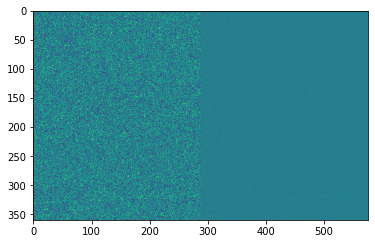

00bce5685 0.991
tensor(0.2328) tensor(0.7795)


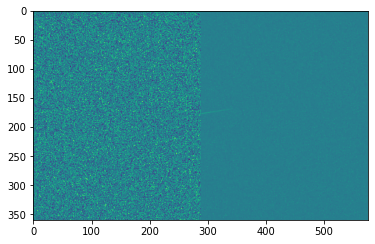

00f226552 0.991
tensor(0.2323) tensor(0.8813)


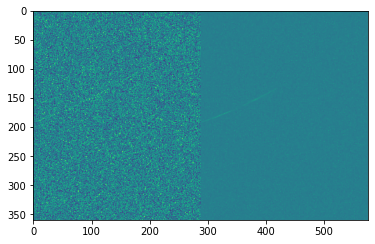

012992291 0.991
tensor(0.2287) tensor(0.9093)


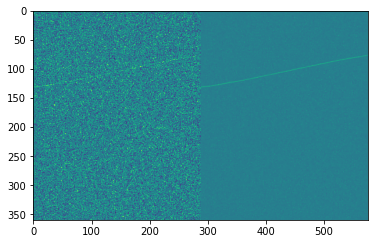

0153a00c9 0.991
tensor(0.1470) tensor(1.1117)


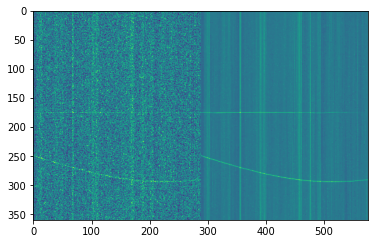

015bf0213 0.991
tensor(0.2221) tensor(0.7445)


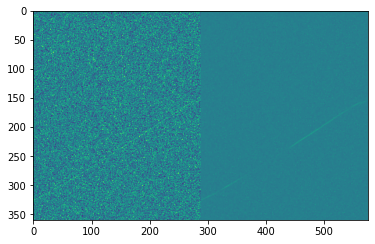

017a7c7f1 0.991
tensor(0.1996) tensor(1.0357)


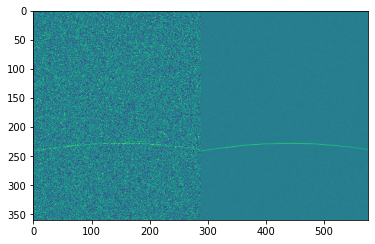

0195324d2 0.991
tensor(0.2287) tensor(0.7982)


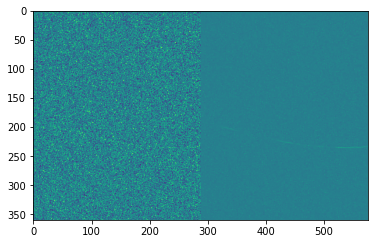

01cb9865c 0.991
tensor(0.2297) tensor(1.1497)


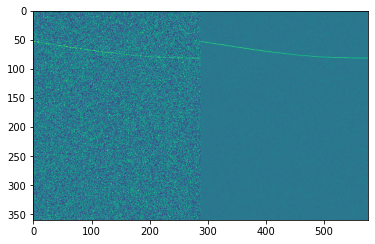

01dc5af02 0.991
tensor(0.2092) tensor(0.9885)


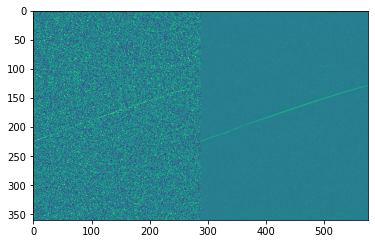

023aebec4 0.991
tensor(0.2108) tensor(1.0776)


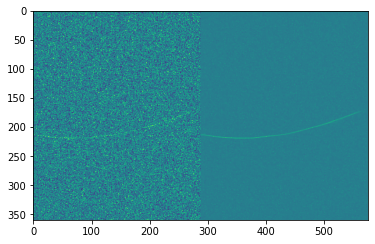

028b6615d 0.991
tensor(0.2290) tensor(0.8169)


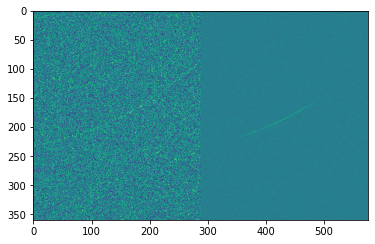

02c2e5de1 0.991
tensor(0.2148) tensor(1.0137)


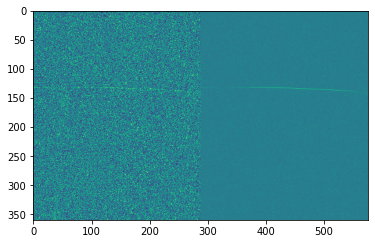

0302d47d0 0.991
tensor(0.2303) tensor(0.6920)


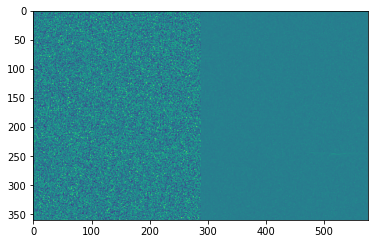

030658180 0.991
tensor(0.2272) tensor(0.6810)


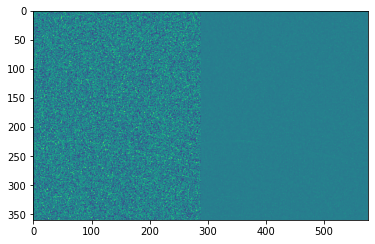

0354a13e2 0.991
tensor(0.1225) tensor(1.0416)


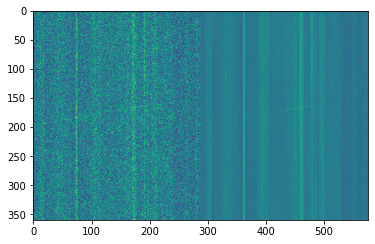

03717ca39 0.991
tensor(0.2255) tensor(0.6564)


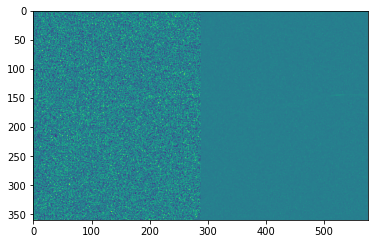

03e372f65 0.991
tensor(0.2135) tensor(0.6585)


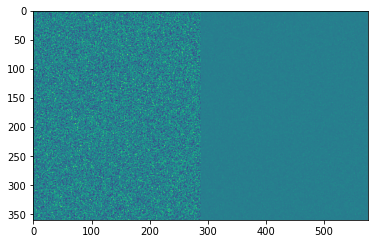

040d11e2d 0.991
tensor(0.2330) tensor(0.6963)


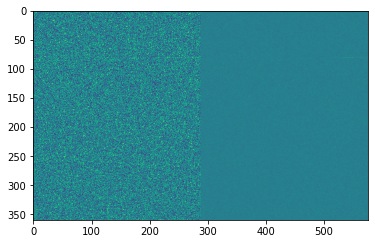

04592c3d1 0.991
tensor(0.1449) tensor(1.0193)


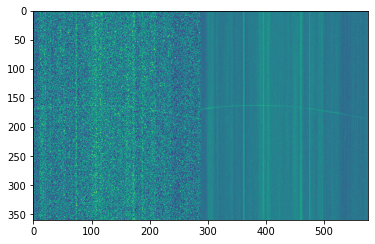

047fb9ed5 0.991
tensor(0.2266) tensor(0.9633)


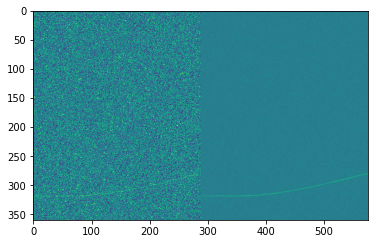

04e4f4a4c 0.991
tensor(0.2316) tensor(0.6801)


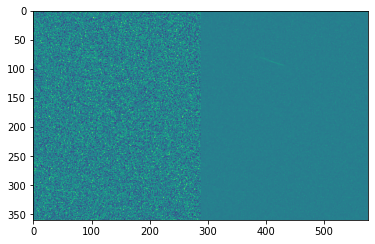

051895cd1 0.991
tensor(0.2276) tensor(0.7247)


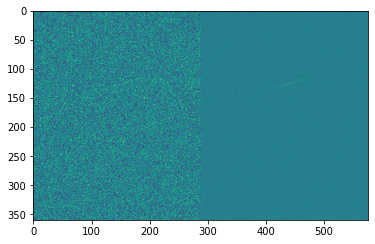

05b1b9d6c 0.992
tensor(0.2318) tensor(0.6615)


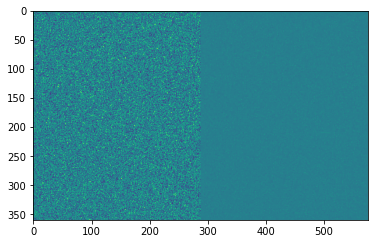

05cad0ed3 0.991
tensor(0.1993) tensor(0.9677)


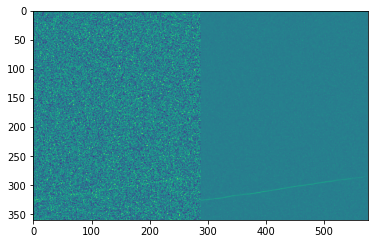

05eda6f5a 0.991
tensor(0.2365) tensor(0.8232)


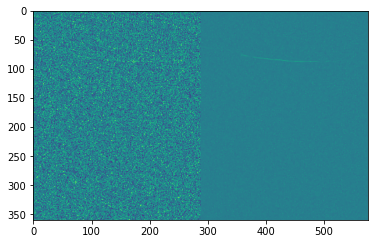

0611d3c27 0.991
tensor(0.1733) tensor(1.1227)


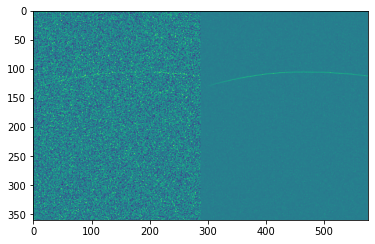

0639bd69d 0.991
tensor(0.2242) tensor(0.7974)


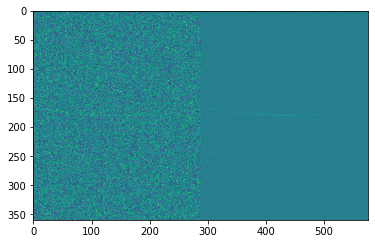

0675028e4 0.991
tensor(0.2107) tensor(1.0982)


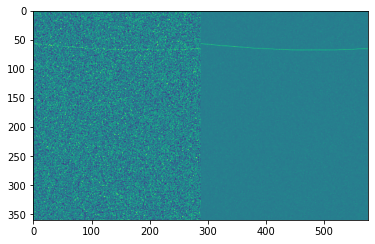

06ac9d3ea 0.991
tensor(0.1840) tensor(0.9635)


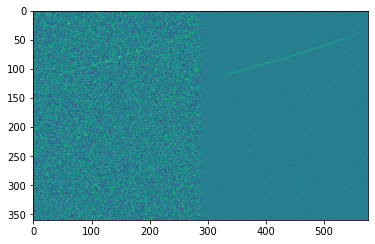

077a11239 0.991
tensor(0.2168) tensor(1.0354)


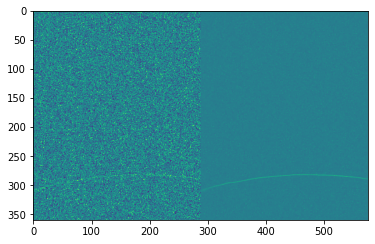

077a57010 0.991
tensor(0.2185) tensor(1.0846)


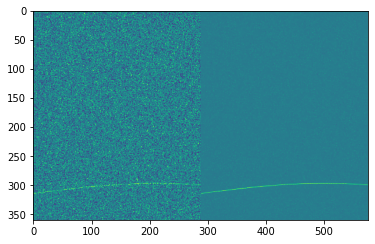

07b2073db 0.991
tensor(0.1218) tensor(1.1566)


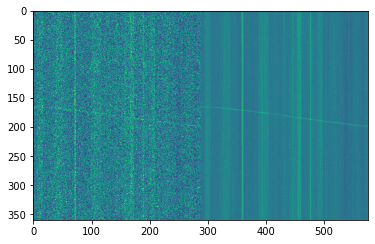

07cd0847f 0.991
tensor(0.2309) tensor(0.8231)


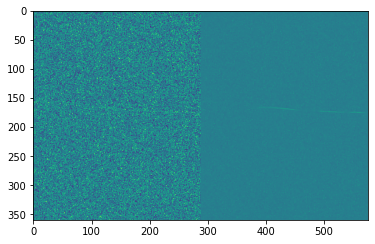

07dd7e0e2 0.991
tensor(0.2284) tensor(0.7102)


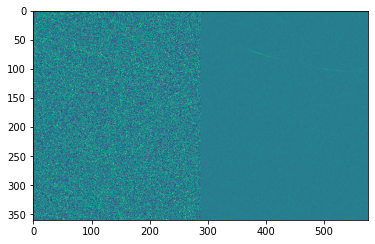

08f6988f4 0.991
tensor(0.2253) tensor(0.9318)


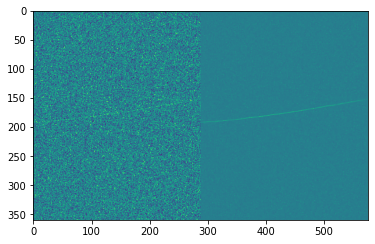

092c9af35 0.991
tensor(0.1902) tensor(1.1147)


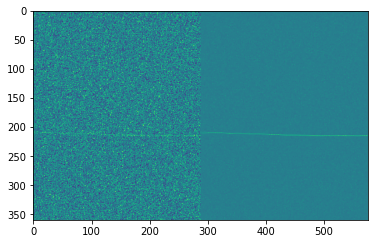

094687e08 0.991
tensor(0.2263) tensor(0.9741)


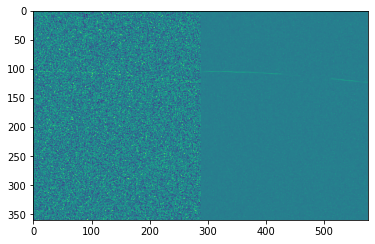

0986a1a52 0.991
tensor(0.2272) tensor(0.6706)


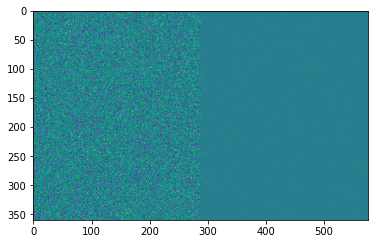

0a2e0807c 0.991
tensor(0.2191) tensor(0.9735)


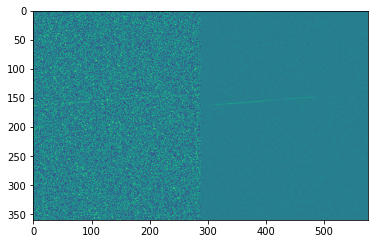

0a61f1932 0.991
tensor(0.2176) tensor(0.8185)


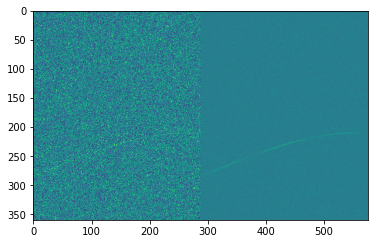

0a9780441 0.991
tensor(0.2295) tensor(0.7757)


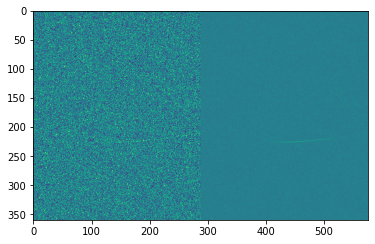

0a9def5f6 0.991
tensor(0.2308) tensor(0.6861)


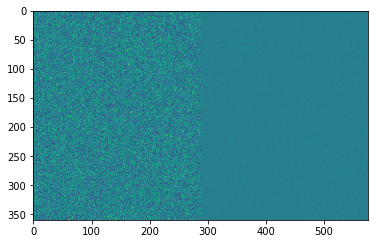

0ae4c93c8 0.991
tensor(0.1569) tensor(1.0065)


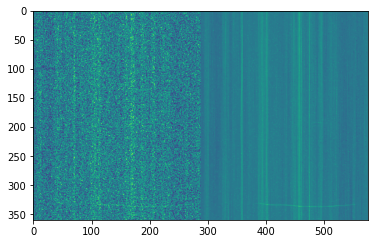

0ae892b99 0.991
tensor(0.2300) tensor(0.6770)


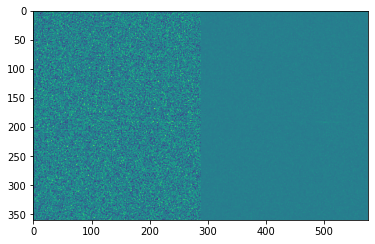

0afa0bb1b 0.991
tensor(0.2064) tensor(0.9312)


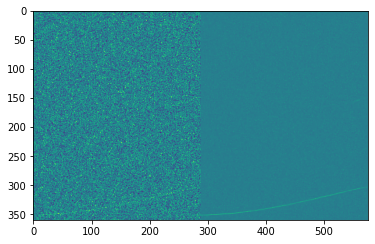

0b374033a 0.991
tensor(0.2374) tensor(0.6503)


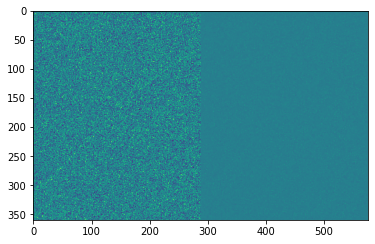

0bce75cc0 0.991
tensor(0.2276) tensor(0.6727)


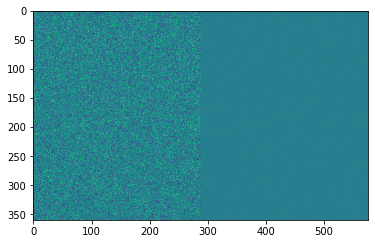

0bfb2a22e 0.991
tensor(0.2058) tensor(1.0669)


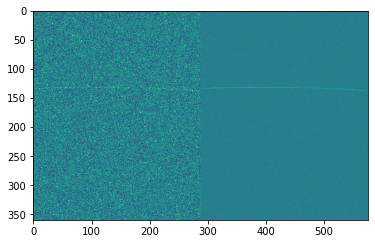

0c5136dfc 0.991
tensor(0.1451) tensor(1.0171)


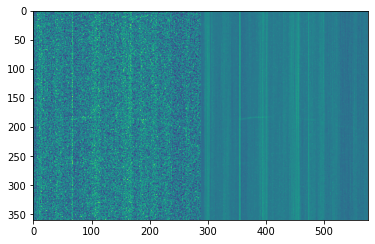

0c77ff3f8 0.991
tensor(0.2326) tensor(0.6890)


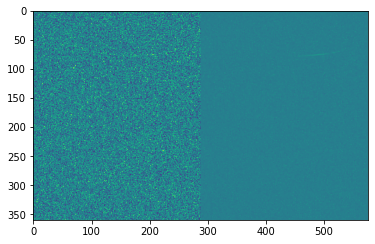

0c7f63a4c 0.991
tensor(0.2282) tensor(0.7614)


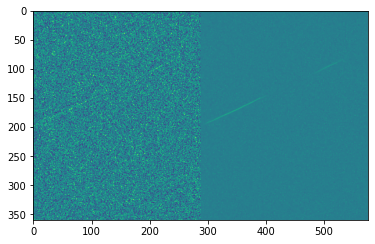

0cac0b665 0.991
tensor(0.1391) tensor(0.9573)


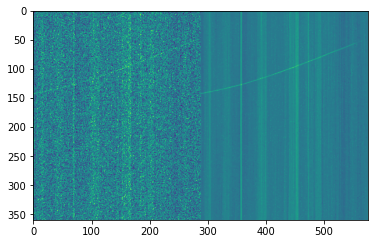

0d0e5974b 0.991
tensor(0.2305) tensor(0.6489)


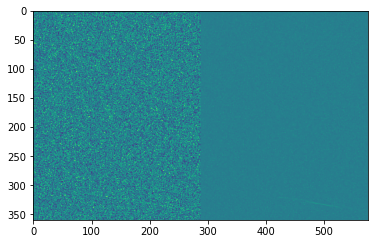

0d0fb754f 0.991
tensor(0.2094) tensor(0.9963)


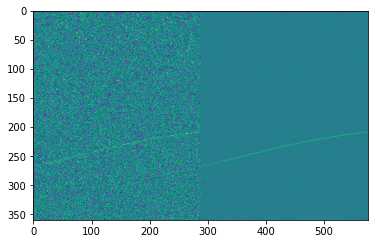

0d16c6139 0.991
tensor(0.1911) tensor(1.1441)


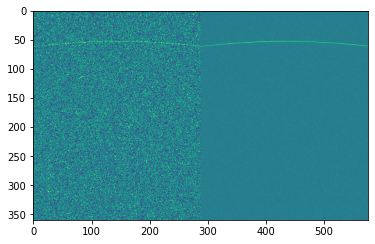

0d70d7ce1 0.991
tensor(0.2310) tensor(0.7745)


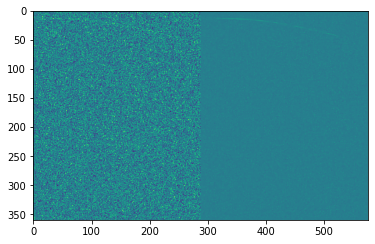

0d9fd6c93 0.991
tensor(0.2294) tensor(0.8791)


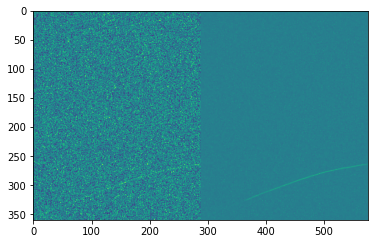

0dcfb8530 0.991
tensor(0.2196) tensor(0.7272)


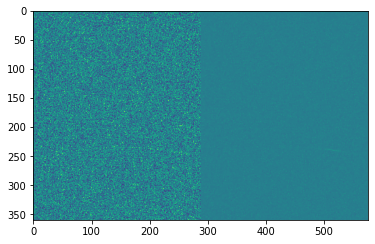

0dfe6acb4 0.991
tensor(0.2014) tensor(0.8481)


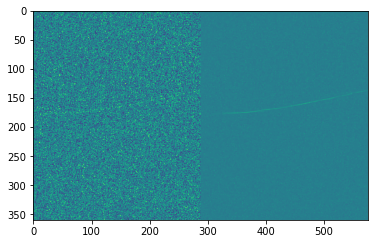

0e168818a 0.991
tensor(0.2321) tensor(0.6542)


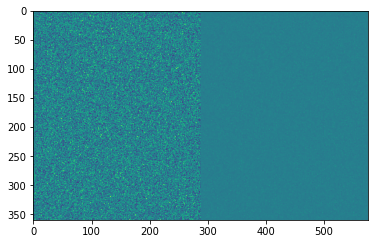

0e26a554b 0.991
tensor(0.2270) tensor(0.8457)


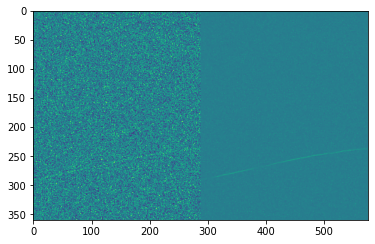

0e33ca7db 0.991
tensor(0.1761) tensor(0.9751)


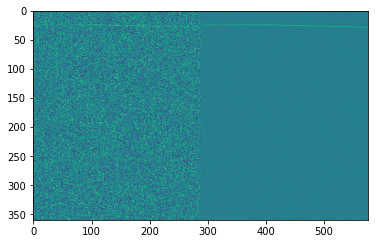

0eaafb22f 0.991
tensor(0.2103) tensor(0.8639)


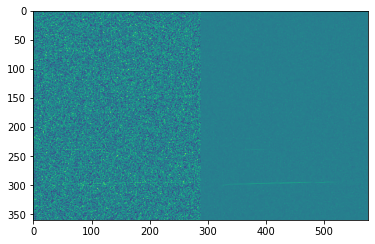

0ebff2780 0.991
tensor(0.2109) tensor(0.8414)


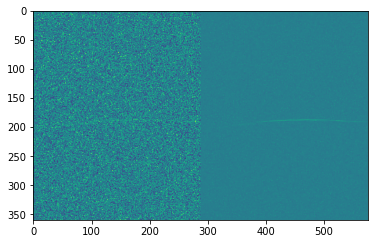

0f9dd9eca 0.991
tensor(0.2328) tensor(0.8277)


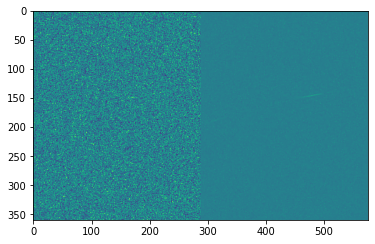

0fc3c449f 0.991
tensor(0.1580) tensor(1.0273)


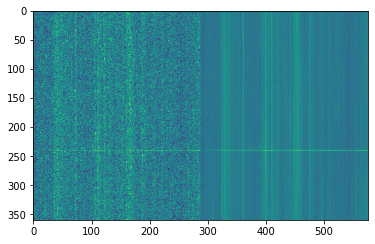

0fefc4fd9 0.991
tensor(0.2205) tensor(0.7041)


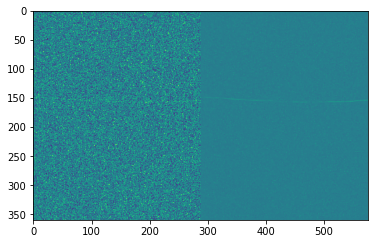

1081950a3 0.991
tensor(0.2324) tensor(0.9326)


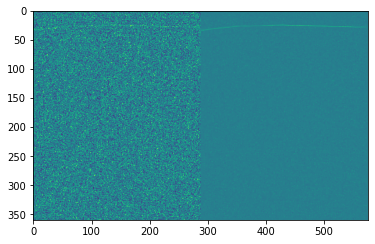

11c6c76ab 0.991
tensor(0.2305) tensor(0.8234)


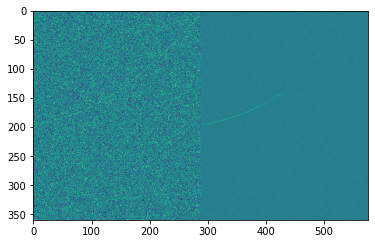

1242a70e8 0.991
tensor(0.2204) tensor(1.0213)


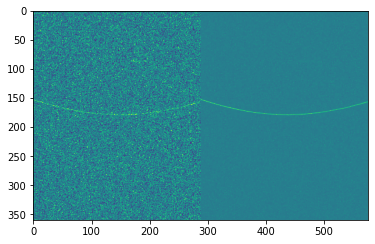

1286e574f 0.991
tensor(0.2007) tensor(1.0059)


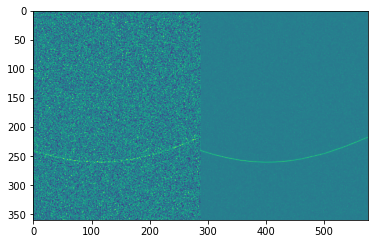

12b3ae845 0.991
tensor(0.1453) tensor(1.0449)


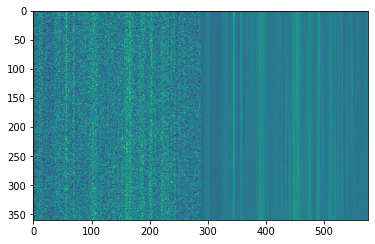

12d8eed90 0.991
tensor(0.2286) tensor(0.7580)


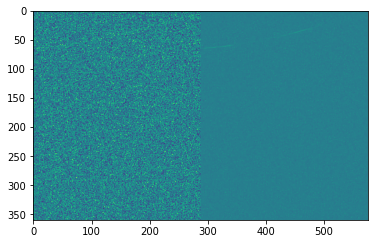

12db0b252 0.991
tensor(0.2306) tensor(0.6526)


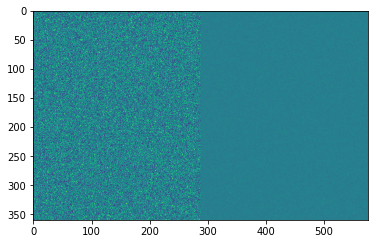

13731679d 0.991
tensor(0.1406) tensor(1.0815)


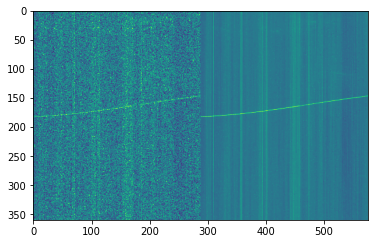

137a2ed27 0.991
tensor(0.2302) tensor(0.9533)


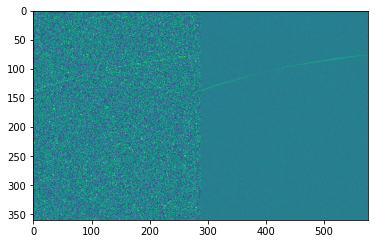

137d4d41b 0.991
tensor(0.2293) tensor(0.7694)


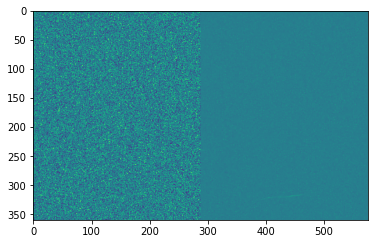

13ab0a0b2 0.991
tensor(0.2072) tensor(1.1291)


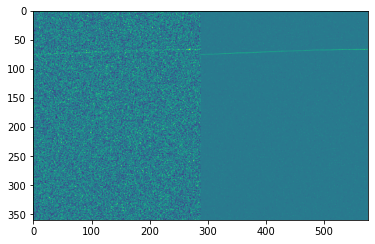

13c0417d6 0.991
tensor(0.2273) tensor(1.0817)


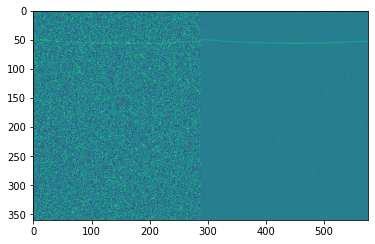

13c184cdc 0.991
tensor(0.2187) tensor(0.6765)


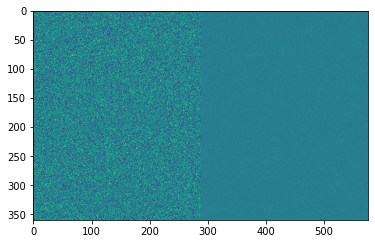

13ddf3c72 0.991
tensor(0.1044) tensor(1.0493)


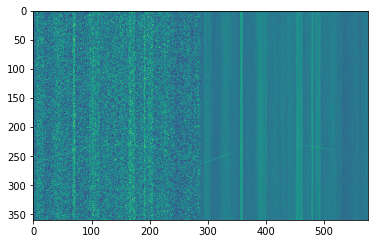

13fe3dabb 0.991
tensor(0.2310) tensor(0.6998)


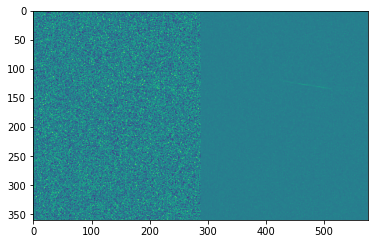

147fbd0fe 0.991
tensor(0.1927) tensor(0.7970)


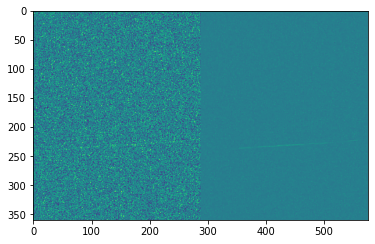

14d7c9498 0.991
tensor(0.1377) tensor(1.0255)


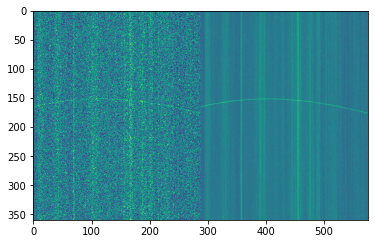

14dfefcd5 0.991
tensor(0.1366) tensor(1.0920)


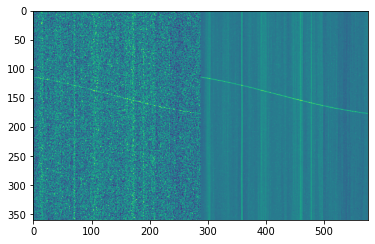

14eb4a20c 0.991
tensor(0.1448) tensor(1.1120)


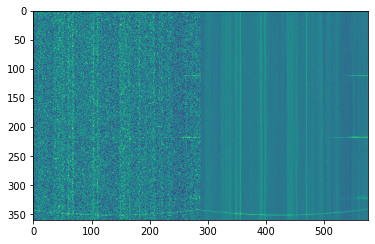

15149b585 0.991
tensor(0.2273) tensor(1.1832)


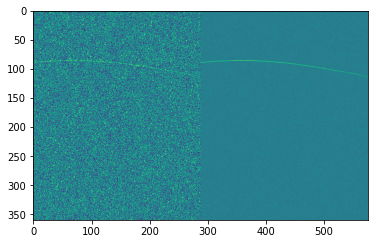

154e3c957 0.991
tensor(0.2241) tensor(0.8003)


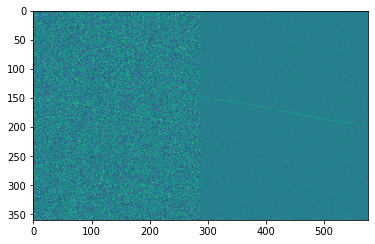

15785900e 0.991
tensor(0.2261) tensor(0.8191)


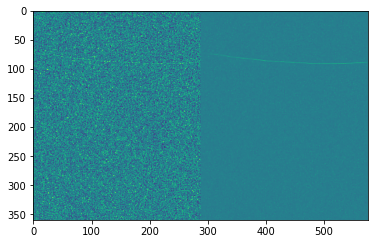

159be4894 0.991
tensor(0.2332) tensor(0.6647)


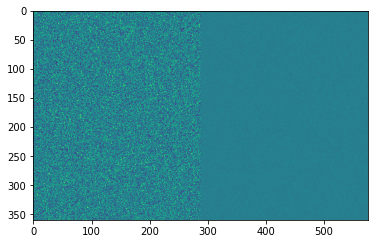

15b0fd78b 0.991
tensor(0.1928) tensor(1.0109)


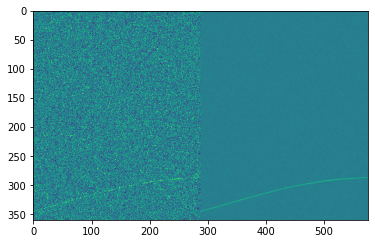

15ecfbf90 0.991
tensor(0.2024) tensor(0.9957)


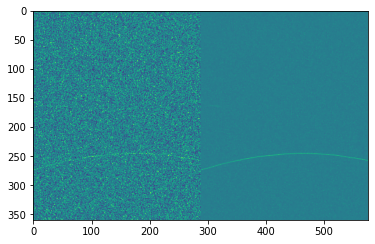

15fc931ea 0.991
tensor(0.1501) tensor(1.0337)


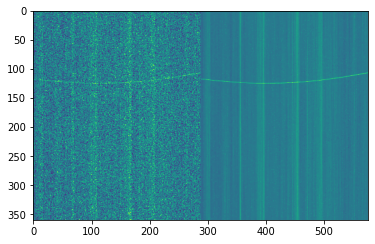

16045a50d 0.991
tensor(0.2309) tensor(0.7459)


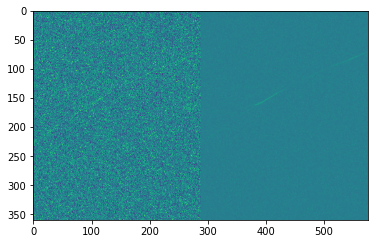

161dff33f 0.991
tensor(0.2321) tensor(0.7652)


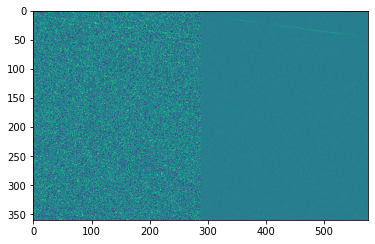

162395d96 0.991
tensor(0.1603) tensor(1.0716)


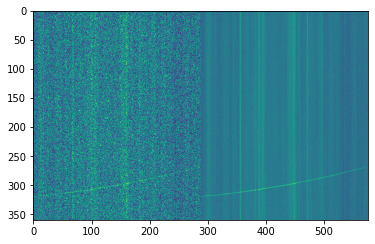

1623af52f 0.991
tensor(0.2233) tensor(0.7736)


In [ ]:
for k in range(100):
    img = tst_ds[k].unsqueeze(0)
    print(Path(tst_ds.df.iloc[k].id).stem, tst_ds.df.iloc[k].target)
    with torch.no_grad():
        out = custom_model(img.cuda()).detach().cpu()
        print(out[0].min(), out[0].max())
        customplot(img[0], out[0])
        plt.pause(0.1)



In [ ]:
ou